## Notes

This file contains the code used for the MNIST simulations.

(This file contains the code for our algorithm and for GDA, for the MNIST dataset.  For our algorithm with acceptance rate 1/5, set the "rate" paramter to "rate = 5".  For GDA, set the "rate" parameter to rate = 1.)



In [ ]:
!pip install keras
!pip install --upgrade keras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# utils_Picky_grayscale

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# import tensorflow as tf
from keras.layers import Input, Dense
from keras.models import Sequential
from keras.layers import Dropout
from keras.models import Model

import keras
from keras.datasets import mnist
from keras.datasets import cifar10

from tqdm import tqdm_notebook as tqdm
from tensorflow.keras.layers import LeakyReLU
# from keras.layers.advanced_activations import LeakyReLU

from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

from numpy import expand_dims
from numpy import mean
from numpy import ones
from numpy.random import randn
from numpy.random import randint
from keras.datasets.mnist import load_data
from keras import backend
from keras.optimizers import RMSprop
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import BatchNormalization
from keras.initializers import RandomNormal
from keras.constraints import Constraint

# from keras.optimizers import Optimizer
# from tensorflow.keras import backend
from keras.optimizers import Adam, SGD

from tqdm.notebook import tqdm
from functools import partial
from matplotlib.image import imread

# The Players class defines the two-player game and all necessary update functions
# x - min player
# y - max player
# f - a function of x, y to create new entity z
# u_x - function to take gradient update step of min player x
# u_y - function to take gradient update step of max player y
# c_x - function to change value of x to x_new
# c_y - function to change value of y to y_new
# p_x - function to perturb value of x along a random normal direction

class Players:
    def __init__(self, x, y, f, u_x, u_y, c_x, c_y, p_x):
        self.x = x
        self.y = y
        if f == None:
            self.z = None
        else:
            self.z = f(x, y)
        self.u_x = u_x
        self.u_y = u_y
        self.c_x = c_x
        self.c_y = c_y
        self.p_x = p_x

    def value(self, f):
        return f(self.x, self.y)

    def get_x(self):
        return self.x

    def get_y(self):
        return self.y

    def update_x(self):
        self.x = self.u_x(self.x, self.y, self.z)
        return self.x

    def update_y(self):
        self.y = self.u_y(self.x, self.y, self.z)
        return self.y

    def change_x(self, x_new):
        self.x = self.c_x(self.x, x_new)

    def change_y(self, y_new):
        self.y = self.c_y(self.y, y_new)

    def perturb_x(self):
        self.x = self.p_x(self.x)
        return self.x


# img = imread('image_digit_1.png')
# img = img.reshape(400)

batch_size = 128

def getGDopt(lr = 0.01):
    return SGD(lr)

# Load Mnist data
def load_data(filter=True, balanced=True):
    (x_train, y_train), (x_test, y_test) = mnist.load_data()
    x_train = (x_train.astype(np.float32) - 127.5)/127.5
    x_train = x_train.reshape(len(x_train), 784)

    x_test = (x_test.astype(np.float32) - 127.5)/127.5
    x_test = x_test.reshape(len(x_test), 784)

    # restricting to digits 0 and 1
    if filter:
        train_filter = np.where((y_train == 0 ) | (y_train == 1))
        x_train, y_train = x_train[train_filter], y_train[train_filter]

        test_filter = np.where((y_test == 0 ) | (y_test == 1))
        x_test, y_test = x_test[test_filter], y_test[test_filter]

    if balanced and filter:
        f = np.where(y_train == 0)
        x_train_0, y_train_0 = x_train[f], y_train[f]
        f = np.where(y_train == 1)
        x_train_1, y_train_1 = x_train[f], y_train[f]

        if len(y_train_1) > len(y_train_0):
            n = len(y_train_0)
        else:
            n = len(y_train_1)

        x_train = np.array(list(x_train_0[:n]) + list(x_train_1[:n]))
        y_train = np.array(list(y_train_0[:n]) + list(y_train_1[:n]))

    return (x_train, y_train, x_test, y_test)

# (X_train, y_train, X_test, y_test) = load_data()
# X_train = np.array([img]*128)

# Create generator network with preferred optimization function
def create_generator(OUTPUT_SIZE, opt=getGDopt(), INPUT_SIZE=100, loss='binary_crossentropy'):
    generator=Sequential()
    generator.add(Dense(units=256,input_dim=INPUT_SIZE))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(units=512))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(units=1024))
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(units=OUTPUT_SIZE, activation='tanh'))

    if loss == 'binary_crossentropy':
        generator.compile(loss='binary_crossentropy', optimizer=opt)
    else:
        generator.compile(loss=wasserstein_loss, optimizer=opt, metrics=['accuracy'])
    return generator

# Create discriminator network with preferred optimization function
def create_discriminator(INPUT_SIZE, opt=getGDopt(), loss='binary_crossentropy'):
    discriminator=Sequential()
    discriminator.add(Dense(units=1024,input_dim=INPUT_SIZE))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))

    discriminator.add(Dense(units=512))
    discriminator.add(LeakyReLU(0.2))
    discriminator.add(Dropout(0.3))

    discriminator.add(Dense(units=256))
    discriminator.add(LeakyReLU(0.2))

    if loss=='binary_crossentropy':
        discriminator.add(Dense(units=1, activation='sigmoid'))
    else:
        discriminator.add(Dense(units=1))

    discriminator.trainable = True
    if loss == 'binary_crossentropy':
        discriminator.compile(loss='binary_crossentropy', optimizer=opt)
    else:
        discriminator.compile(loss=wasserstein_loss, optimizer=opt, metrics=['accuracy'])
    return discriminator

def create_gan(generator, discriminator, opt=getGDopt(lr=0.01), loss='binary_crossentropy'):
    discriminator.trainable=False
    input_size = int(generator.input.shape[1])
    gan_input = Input(shape=(input_size,))
    x = generator(gan_input)
    gan_output= discriminator(x)
    gan= Model(inputs=gan_input, outputs=gan_output)

    if loss == 'binary_crossentropy':
        gan.compile(loss='binary_crossentropy', optimizer=opt)
    else:
        gan.compile(loss=wasserstein_loss, optimizer=opt, metrics=['accuracy'])


    return gan

# gradient update steps for discriminator
def take_discriminator_steps(generator, discriminator, gan, X_train, k=1, NOISE_SIZE=100):
    for _ in range(k):

        noise= np.random.normal(0,1, [batch_size, NOISE_SIZE])
        generated_images = generator.predict(noise)

        image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]

        X= np.concatenate([image_batch, generated_images])

        y_dis = np.zeros(2*batch_size)
        y_dis[:batch_size] = 1

        discriminator.trainable=True
        loss = discriminator.train_on_batch(X, y_dis)

    return discriminator

# gradient update steps for discriminator
def take_discriminator_steps_wgan(generator, discriminator, gan, X_train, k=1, NOISE_SIZE=100, clip=False, clip_value=None):
    for _ in range(k):
        if clip and clip_value is not None:
            for layer in discriminator.layers:
                weights = layer.get_weights()
                weights = [np.clip(w, -clip_value, clip_value) for w in weights]
                layer.set_weights(weights)


        noise= np.random.normal(0,1, [batch_size, NOISE_SIZE])
        generated_images = generator.predict(noise)

        image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]

        X= np.concatenate([image_batch, generated_images])

        y_dis = np.ones(2*batch_size)
        y_dis[:batch_size] = -1

        discriminator.trainable=True
        loss = discriminator.train_on_batch(X, y_dis)
#         print ("D-loss", loss)

    return discriminator

# perturbing weights of the generator
def perturb_generator(generator, sigma=0.001):
    weights, u = [], []
    for wt in generator.get_weights():
        u.append(np.random.normal(0, 1, wt.shape))
        wt = wt + u[-1] * sigma
        weights.append(wt)

    generator.set_weights(weights)

    return generator

# gradient update steps for generator
def take_generator_steps(generator, discriminator, gan, NOISE_SIZE=100):
    noise= np.random.normal(0,1, [batch_size, NOISE_SIZE])
    generated_images = generator.predict(noise)

#     gan = create_gan(discriminator, generator)

    y_gen = np.ones(batch_size)
    discriminator.trainable=False
    loss = gan.train_on_batch(noise, y_gen)
#     print ("G-loss", loss)

    return generator

def take_generator_steps_wgan(generator, discriminator, gan, NOISE_SIZE=100):
    noise= np.random.normal(0,1, [batch_size, NOISE_SIZE])
    generated_images = generator.predict(noise)

    y_gen = -np.ones(batch_size)
    discriminator.trainable=False
    loss = gan.train_on_batch(noise, y_gen)
#     print ("G-loss", loss)

    return generator

def change_network(modela, modelb):
    modela.set_weights(modelb.get_weights())
    return modela

def wasserstein_loss(y_true, y_pred):
    return backend.mean(y_true * y_pred)

def getLoss(generator, discriminator, X_train, NOISE_SIZE=100, eps=0):

    noise= np.random.normal(0,1, [batch_size, NOISE_SIZE])
    image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]
    generated_images = generator.predict(noise)

    probabilities_1 = discriminator.predict(image_batch).reshape(len(image_batch))
    probabilities_1 = np.log(probabilities_1 + eps)

    probabilities_2 = discriminator.predict(generated_images).reshape(len(generated_images))
    probabilities_2 = np.log(1 - probabilities_2 + eps)

    return np.mean(probabilities_1) + np.mean(probabilities_2)

def getWassersteinLoss(generator, discriminator, X_train, NOISE_SIZE=100, eps=0):

    noise= np.random.normal(0,1, [batch_size, NOISE_SIZE])
    image_batch =X_train[np.random.randint(low=0,high=X_train.shape[0],size=batch_size)]
    generated_images = generator.predict(noise)

    disc_1 = discriminator.predict(image_batch).reshape(len(image_batch))
    disc_2 = discriminator.predict(generated_images).reshape(len(generated_images))
    y_pred = np.array(list(disc_1) + list(disc_2))
    y_true = np.ones(2*batch_size)
    y_true[:batch_size] = -1

    loss = np.mean(y_true*y_pred)
    return loss

def getLossFixedBatch(generator, discriminator, image_batch, generated_images):

    probabilities_1 = discriminator.predict(image_batch).reshape(len(image_batch))
    probabilities_1 = np.log(probabilities_1) / np.log(2)

    probabilities_2 = discriminator.predict(generated_images).reshape(len(generated_images))
    probabilities_2 = np.log(1 - probabilities_2) / np.log(2)

    return np.mean(probabilities_1) + np.mean(probabilities_2)


# Creating a GAN player object
def create_GAN_player():
    ganPlayer = Players(create_generator(), create_discriminator(), create_gan, take_generator_steps, take_discriminator_steps, change_network, change_network, perturb_generator)
    return ganPlayer


def plot_generated_images(epoch, generator, folder="", save = False, image_shape=(28,28), examples=100, dim=(10,10), figsize=(10,10),name=""):
    print ("Iteration " + str(epoch))
    noise= np.random.normal(loc=0, scale=1, size=[examples, 100])
    generated_images = generator.predict(noise)
    generated_images = generated_images.reshape(examples,image_shape[0], image_shape[1])
    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray')
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig(folder+name %epoch)

######################################################################


# select real samples
def generate_real_samples(dataset, n_samples):
	# choose random instances
	ix = randint(0, dataset.shape[0], n_samples)
	# select images
	X = dataset[ix]
	# generate class labels, -1 for 'real'
	y = -ones((n_samples, 1))
	return X, y

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(generator, latent_dim, n_samples):
	# generate points in latent space
	x_input = generate_latent_points(latent_dim, n_samples)
	# predict outputs
	X = generator.predict(x_input)
	# create class labels with 1.0 for 'fake'
	y = ones((n_samples, 1))
	return X, y

# generate samples and save as a plot and save the model
def summarize_performance(step, g_model, latent_dim, n_samples=100):
	# prepare fake examples
	X, _ = generate_fake_samples(g_model, latent_dim, n_samples)
	# scale from [-1,1] to [0,1]
	X = (X + 1) / 2.0
	# plot images
	for i in range(10 * 10):
		# define subplot
		plt.subplot(10, 10, 1 + i)
		# turn off axis
		plt.axis('off')
		# plot raw pixel data
		plt.imshow(X[i, :, :, 0], cmap='gray_r')
	# save plot to file
	filename1 = 'generated_plot_%04d.png' % (step+1)
	plt.savefig(filename1)
	plt.close()
	# save the generator model
	filename2 = 'model_%04d.h5' % (step+1)
	g_model.save(filename2)
	print('>Saved: %s and %s' % (filename1, filename2))

# create a line plot of loss for the gan and save to file
def plot_history(d1_hist, d2_hist, g_hist):
	# plot history
	plt.plot(d1_hist, label='crit_real')
	plt.plot(d2_hist, label='crit_fake')
	plt.plot(g_hist, label='gen')
	plt.legend()
	plt.savefig('plot_line_plot_loss.png')
	plt.close()

In [ ]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import random


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy

from keras.optimizers import Adam#, SGD
import sys
sys.path.append("../")
from keras import backend as K

# from utils_Picky_grayscale import *       # utils file has the filler code and helper functions

from tqdm.notebook import tqdm
from functools import partial

In [ ]:
NOISE_SIZE = 100
IMAGE_SIZE = 784

In [ ]:
# #set filter = true to include only the digits "0" and "1" in the MNIST dataset
# X, y, X_test, y_test = load_data(filter=True, balanced=False)

from keras.datasets import mnist
import numpy as np

def load_data(filter=True, balanced=False):
    # Load the MNIST dataset
    (X_train, y_train), (X_test, y_test) = mnist.load_data()

    # Filter the dataset to include only 0 and 1
    if filter:
        filter_train = np.logical_or(y_train == 0, y_train == 1)
        filter_test = np.logical_or(y_test == 0, y_test == 1)
        X_train, y_train = X_train[filter_train], y_train[filter_train]
        X_test, y_test = X_test[filter_test], y_test[filter_test]

    # Balance the dataset if requested
    if balanced:
        num_samples = min(np.sum(y_train == 0), np.sum(y_train == 1))
        indices_0 = np.where(y_train == 0)[0][:num_samples]
        indices_1 = np.where(y_train == 1)[0][:num_samples]
        indices = np.concatenate([indices_0, indices_1])
        np.random.shuffle(indices)
        X_train, y_train = X_train[indices], y_train[indices]

    return X_train, y_train, X_test, y_test

# Load the filtered MNIST dataset
X_train, y_train, X_test, y_test = load_data(filter=True, balanced=False)
X=X_train
y=y_train

# Print the shape of the filtered dataset
print("Filtered Training data shape:", X_train.shape)
print("Filtered Training labels shape:", y_train.shape)
print("Filtered Testing data shape:", X_test.shape)
print("Filtered Testing labels shape:", y_test.shape)


11490434/11490434 [==============================] - 1s 0us/step
Filtered Training data shape: (12665, 28, 28)
Filtered Training labels shape: (12665,)
Filtered Testing data shape: (2115, 28, 28)
Filtered Testing labels shape: (2115,)


In [ ]:
# Reshape the training and testing data to 1D arrays
X = X.reshape((X_train.shape[0], -1))
X_test = X_test.reshape((X_test.shape[0], -1))


In [ ]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(random_state=0, max_iter=1000).fit(X, y)
clf.score(X_test, y_test)

0.9990543735224586

## Optimizer Selection

In [ ]:
# adam_optimizer = keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

optimizer_name='adagrad' #@param['adam','rmsprop','sgd','adagrad','adadelta','nadam']

if optimizer_name=='adam':
    my_optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
elif optimizer_name=='rmsprop':
    my_optimizer = keras.optimizers.RMSprop(learning_rate=0.0002)
elif optimizer_name=='sgd':
    my_optimizer = keras.optimizers.SGD(learning_rate=0.0002,momentum=0.9)
elif optimizer_name=='adagrad':
    my_optimizer=keras.optimizers.Adagrad(learning_rate=0.0002)
elif optimizer_name=='adadelta':
    my_optimizer=keras.optimizers.Adadelta(learning_rate=1.0)
elif optimizer_name=='nadam':
    my_optimizer=keras.optimizers.Nadam(learning_rate=0.0002)

In [ ]:
# my_optimizer.get_config

## Normal Classifier

In [ ]:
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.utils import to_categorical

(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = X_train.reshape((X_train.shape[0], 28, 28, 1))
X_test = X_test.reshape((X_test.shape[0], 28, 28, 1))

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

model = Sequential()
model.add(Flatten(input_shape=(28, 28, 1)))
model.add(Dense(128, activation='relu'))
model.add(Dense(10, activation='softmax'))

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10)


Epoch 1/10
1875/1875 [==============================] - 9s 2ms/step - loss: 2.9104 - accuracy: 0.8680 - val_loss: 0.5265 - val_accuracy: 0.8964
Epoch 2/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.3864 - accuracy: 0.9164 - val_loss: 0.3685 - val_accuracy: 0.9285
Epoch 3/10
1875/1875 [==============================] - 5s 2ms/step - loss: 0.2782 - accuracy: 0.9326 - val_loss: 0.3216 - val_accuracy: 0.9255
Epoch 4/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2352 - accuracy: 0.9411 - val_loss: 0.3003 - val_accuracy: 0.9320
Epoch 5/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2255 - accuracy: 0.9449 - val_loss: 0.2526 - val_accuracy: 0.9439
Epoch 6/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2054 - accuracy: 0.9488 - val_loss: 0.3165 - val_accuracy: 0.9383
Epoch 7/10
1875/1875 [==============================] - 4s 2ms/step - loss: 0.2002 - accuracy: 0.9516 - val_loss: 0.2467 - val_accuracy:

## Training using GDA

In [ ]:
take_discriminator_steps_2 = partial(take_discriminator_steps, X_train=X, k=1)
getLoss2 = partial(getLoss, X_train=X)
# create_gan2 = partial(create_gan, opt=adam_optimizer)
create_gan2 = partial(create_gan, opt=my_optimizer)

def create_GAN_player():
    # ganPlayer = Players(create_generator(OUTPUT_SIZE=IMAGE_SIZE, opt=adam_optimizer), create_discriminator(INPUT_SIZE=IMAGE_SIZE, opt=adam_optimizer), create_gan2, take_generator_steps, take_discriminator_steps_2, change_network, change_network, perturb_generator)
    ganPlayer = Players(create_generator(OUTPUT_SIZE=IMAGE_SIZE, opt=my_optimizer), create_discriminator(INPUT_SIZE=IMAGE_SIZE, opt=my_optimizer), create_gan2, take_generator_steps, take_discriminator_steps_2, change_network, change_network, perturb_generator)
    return ganPlayer


In [ ]:
def training_gd(create_player_function, create_player_function2, T=3000):
    #Number of iterations

    # this will create a Players object, with two players
    player = create_player_function()
    player2 = create_player_function2()

    j = 0
    losses, ones,ones_list = [], [],[]
    player.update_y()

    for j in tqdm(range(1, T+1)):

        loss = player.value(getLoss2)
        losses.append(loss)

        # perform one gradient update for the generator and one gradient update for the discriminator (we only use "k=1" discriminator gradient steps for MNIST)
        player.update_x()
        player.update_y()

        if j%10 == 0:
            noise= np.random.normal(loc=0, scale=1, size=[1000, 100])
            generated_images = player.get_x().predict(noise)
            ones.append(sum(clf.predict(generated_images))/1000)

            generated_images_reshaped = generated_images.reshape(-1, 28, 28, 1)  # Reshape images
            predicted_labels = np.argmax(model.predict(generated_images_reshaped), axis=1)  # Classify images
            ones_list.append(predicted_labels)
            # Store the labels instead of accuracy
            # predicted_labels = np.argmax(model.predict(generated_images), axis=1)  # Classify images
            # ones_list.append(predicted_labels)  # Store the labels instead of accuracy

        # if j%10 == 0:
        #     noise= np.random.normal(loc=0, scale=1, size=[1000, 100])
        #     generated_images = player.get_x().predict(noise)






        if j%500 == 0:
            plot_generated_images(0, player.get_x(), save=False, examples=25, dim=(5,5), figsize=(3,3))

    return player, losses, ones,ones_list

4/4 [==============================] - 0s 2ms/step


  0%|          | 0/5000 [00:00<?, ?it/s]

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


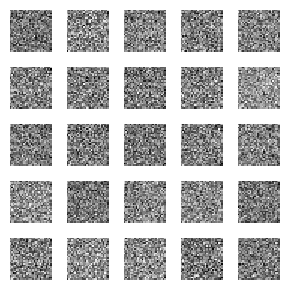

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


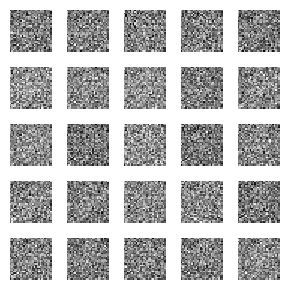

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


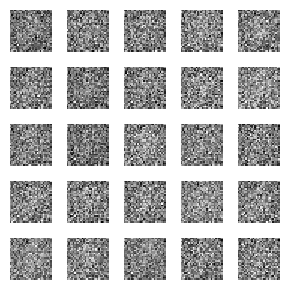

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


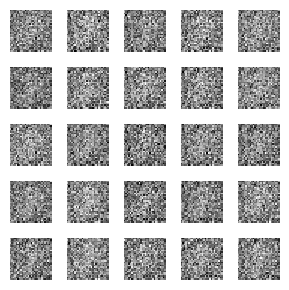

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


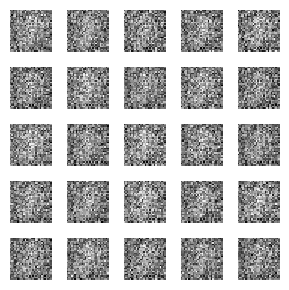

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


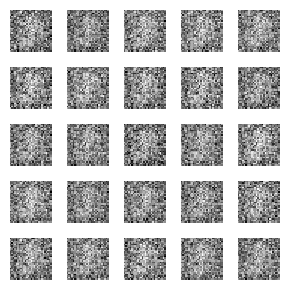

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


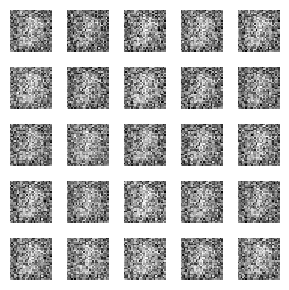

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 17ms/step


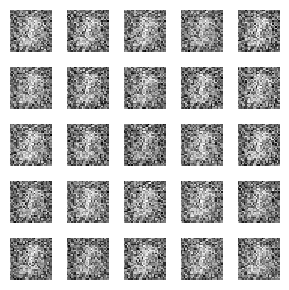

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


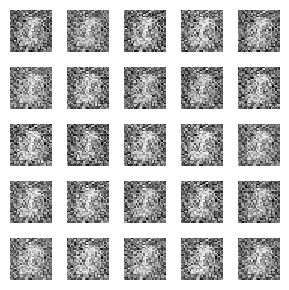

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


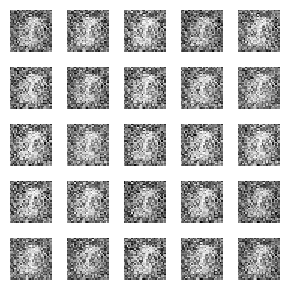

4/4 [==============================] - 0s 2ms/step


  0%|          | 0/5000 [00:00<?, ?it/s]

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


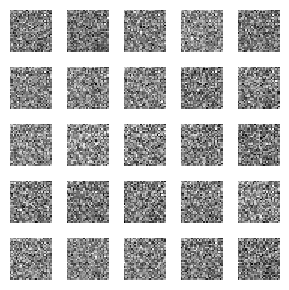

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


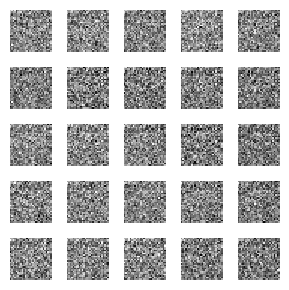

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


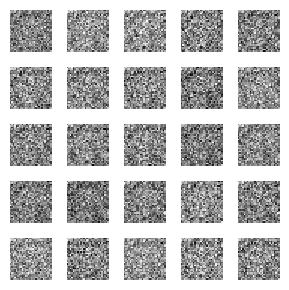

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 19ms/step


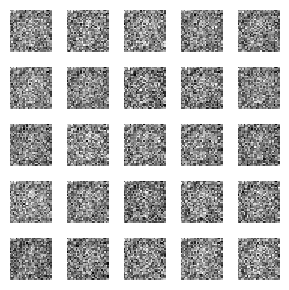

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


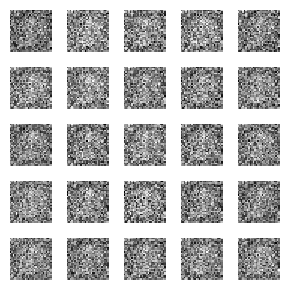

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


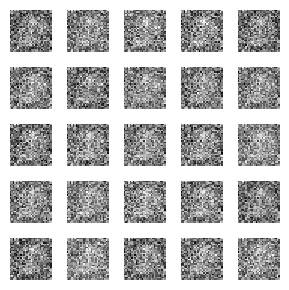

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 26ms/step


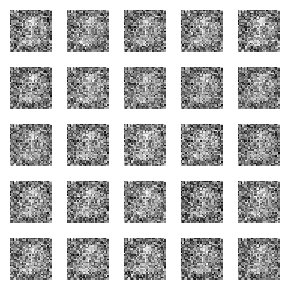

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


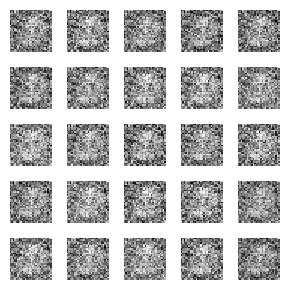

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 19ms/step


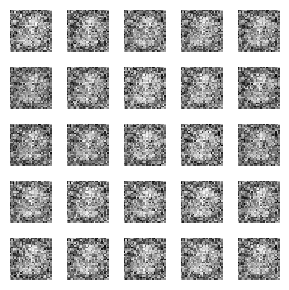

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 18ms/step


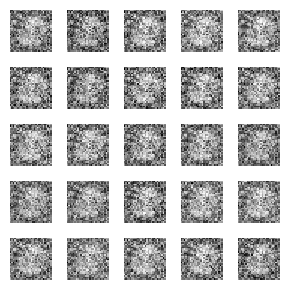

4/4 [==============================] - 0s 4ms/step


  0%|          | 0/5000 [00:00<?, ?it/s]

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


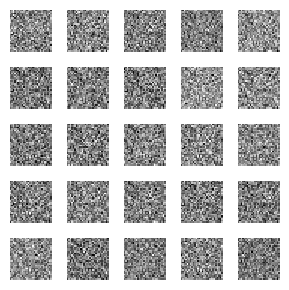

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


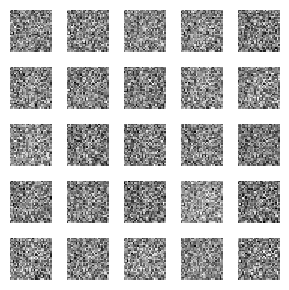

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


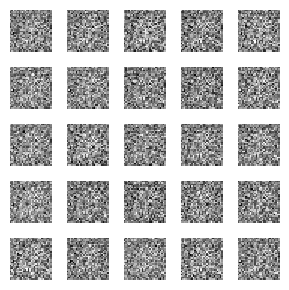

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 25ms/step


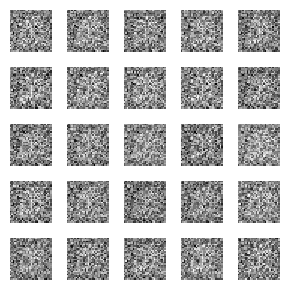

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 19ms/step


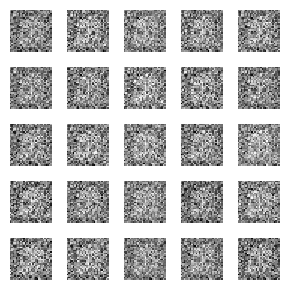

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 19ms/step


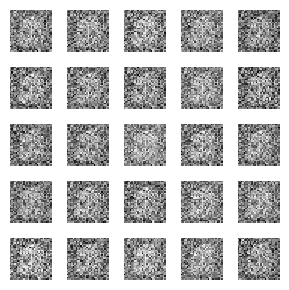

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 22ms/step


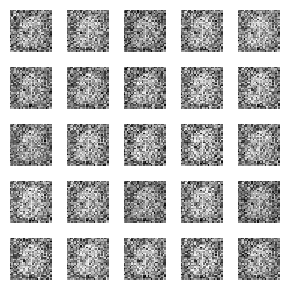

32/32 [==============================] - 0s 1ms/step
Iteration 0
1/1 [==============================] - 0s 19ms/step


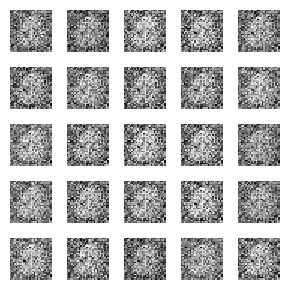

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 19ms/step


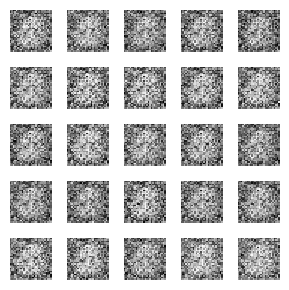

32/32 [==============================] - 0s 2ms/step
Iteration 0
1/1 [==============================] - 0s 20ms/step


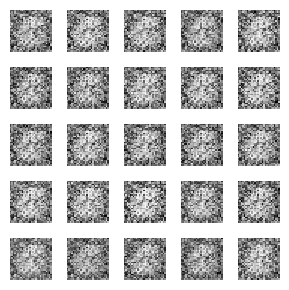

In [ ]:
reps = 3
ones_gda = []
ones_list_gda=[]

for _ in range(reps):
    K.clear_session()
    # adam_optimizer = keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
    take_discriminator_steps_2 = partial(take_discriminator_steps, X_train=X, k=1)
    getLoss2 = partial(getLoss, X_train=X)
    # create_gan2 = partial(create_gan, opt=adam_optimizer)
    create_gan2 = partial(create_gan, opt=my_optimizer)

    ganPlayerGD, losses, ones,ones_list = training_gd(create_GAN_player, create_GAN_player, T=5000)
    ones_gda.append(list(ones))
    ones_list_gda.append(list(ones_list))

<ErrorbarContainer object of 3 artists>

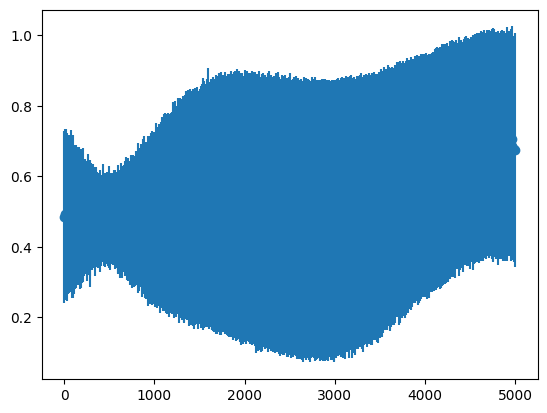

In [ ]:
plt.errorbar(np.linspace(0, 5000, 500), np.mean(ones_gda,axis=0), np.std(ones_gda,axis=0), fmt="o")
# plt.errorbar(np.linspace(0, 10, 1), np.mean(ones_gda,axis=0), np.std(ones_gda,axis=0), fmt="o")

<ErrorbarContainer object of 3 artists>

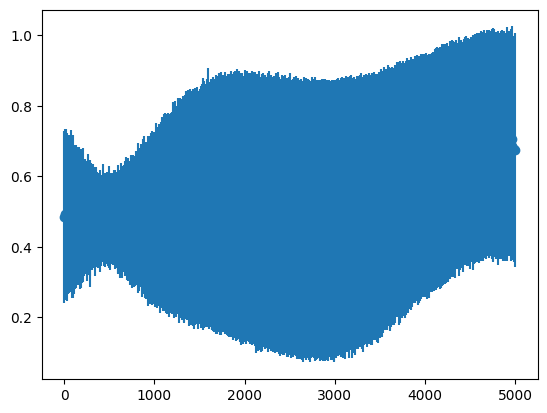

In [ ]:
max_len = max([len(lst) for lst in ones_gda])  # Find the length of the longest list
padded_ones = np.full((len(ones_gda), max_len), np.nan)  # Initialize a numpy array filled with np.nan

for i, lst in enumerate(ones_gda):
    padded_ones[i, :len(lst)] = lst  # Fill in the values from your lists

# Now calculate the mean and standard deviation, ignoring np.nan values
mean_values = np.nanmean(padded_ones, axis=0)
std_values = np.nanstd(padded_ones, axis=0)

plt.errorbar(np.linspace(0, 5000, len(mean_values)), mean_values, std_values, fmt="o")

## Training using Our Algorithm

In [ ]:
def training_gd_mx(create_player_function, create_player_function2, T=3000):
    #Number of iterations

    # this will create a Players object, with two players
    player = create_player_function()
    player2 = create_player_function2()

    j = 0

    losses, ones,ones_list=[], [],[]

    old_loss = 100
    player.update_y()


    #how often to not accept/reject
    rate = 5

    for j in (range(1,T+1)):

        loss = player.value(getLoss2)
        losses.append(loss)


        #save generator weights and the old loss

        if j%rate != 0:
            player2.change_x(player.get_x())
            player2.change_y(player.get_y())
            loss_old = player.value(getLoss2)


        # perform one gradient update for the generator and one gradient update for the discriminator (we only use "k=1" discriminator gradient steps for MNIST)
        player.update_x()
        player.update_y()


        #Accept/reject Step
        if j%rate != 0:
            loss_new = player.value(getLoss2)

            if loss_new > loss_old:
                print("Reject")
                player.change_x(player2.get_x())
                player.change_y(player2.get_y())
            else:
                print("Accept")



        if j%10 == 0:
            noise= np.random.normal(loc=0, scale=1, size=[1000, 100])
            generated_images = player.get_x().predict(noise)
            o = sum(clf.predict(generated_images))/1000
#             print ("--- ONES", o)
            ones.append(o)

            generated_images_reshaped = generated_images.reshape(-1, 28, 28, 1)  # Reshape images
            predicted_labels = np.argmax(model.predict(generated_images_reshaped), axis=1)  # Classify images
            ones_list.append(predicted_labels)

        # if j%10 == 0:
        #     noise= np.random.normal(loc=0, scale=1, size=[1000, 100])
        #     generated_images = player.get_x().predict(noise)
        #     ones.append(sum(clf.predict(generated_images))/1000)



        if j%500 == 0:
            plot_generated_images(j, player.get_x(), save=False, examples=25, dim=(5,5), figsize=(3,3))


    return player, losses, ones,ones_list

  0%|          | 0/3 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

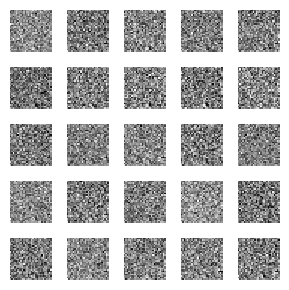

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

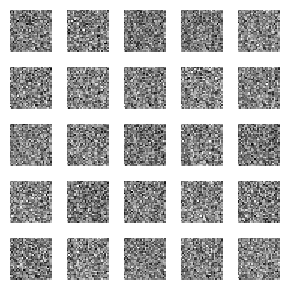

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

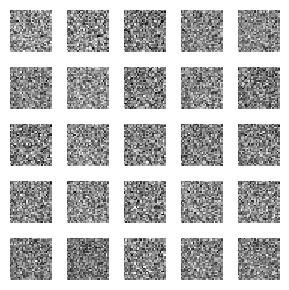

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

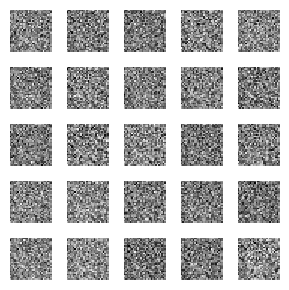

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

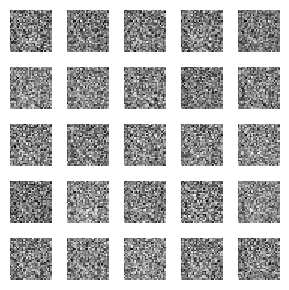

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

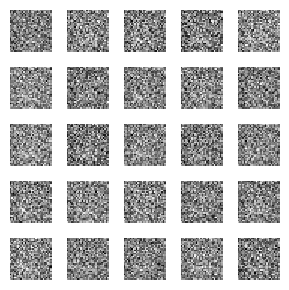

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

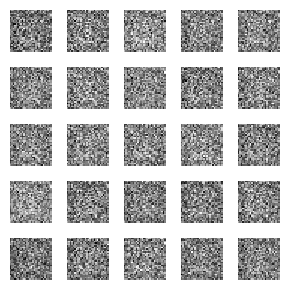

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

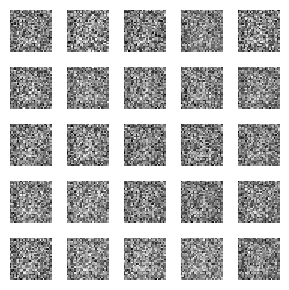

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

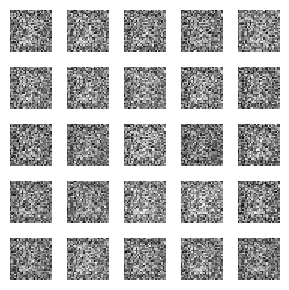

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 5ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 4ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

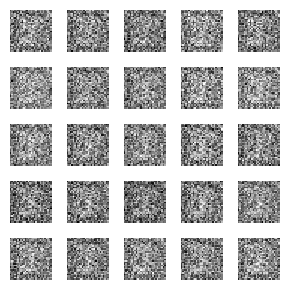

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 7ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

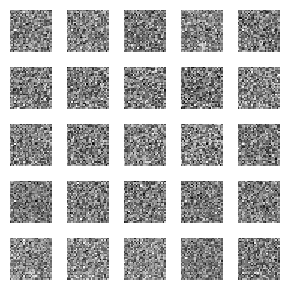

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 3ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

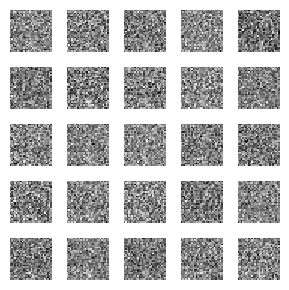

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 6ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 3ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

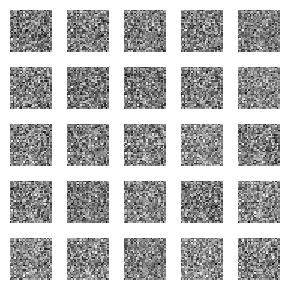

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 5ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

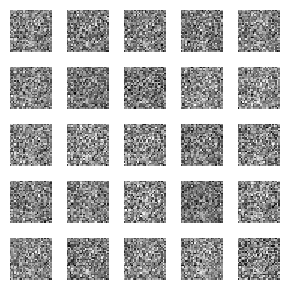

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

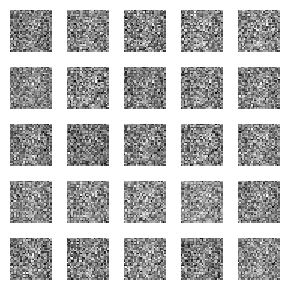

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 3ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 4ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

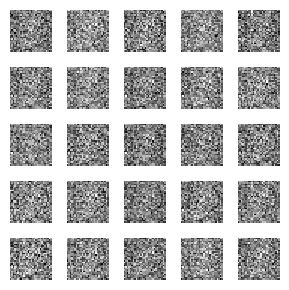

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

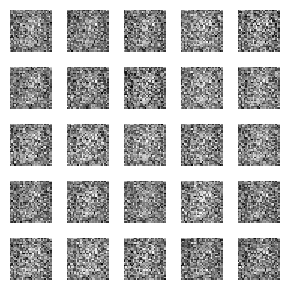

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

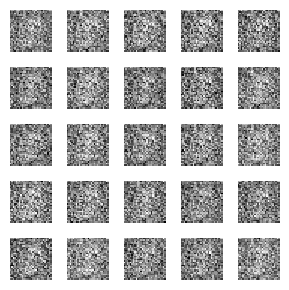

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 5ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

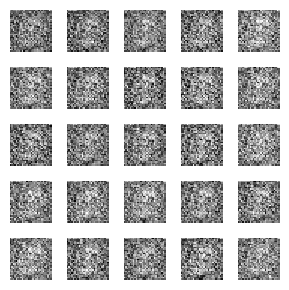

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

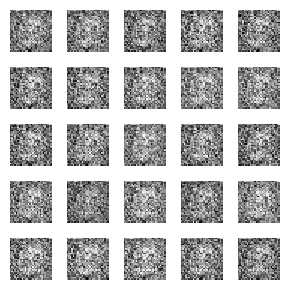

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 3ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

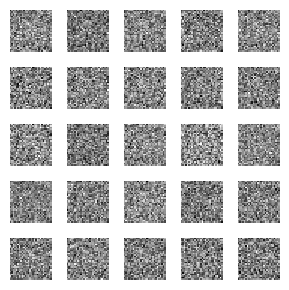

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

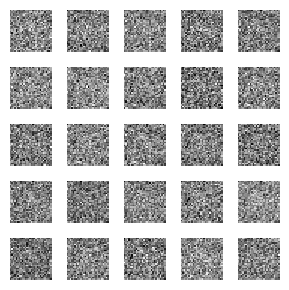

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

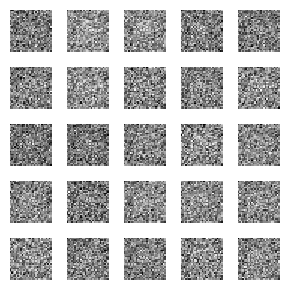

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

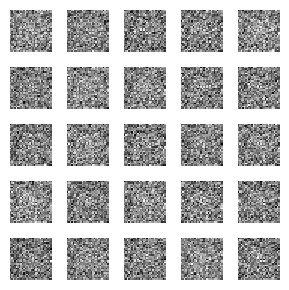

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

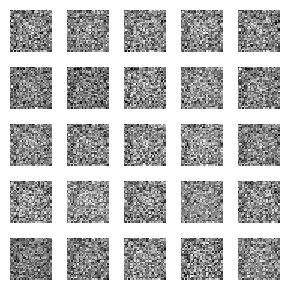

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

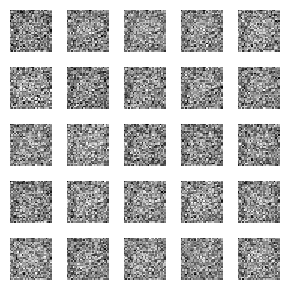

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

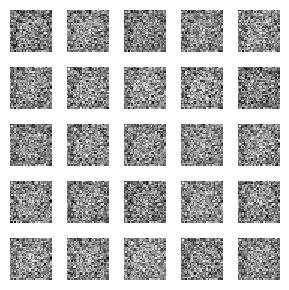

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 3ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [================

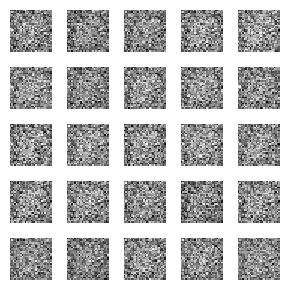

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 9ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [================

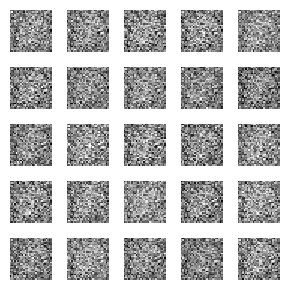

Streaming output truncated to the last 5000 lines.
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 3ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 10ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Reject
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [==============================] - 0s 2ms/step
Accept
4/4 [===============

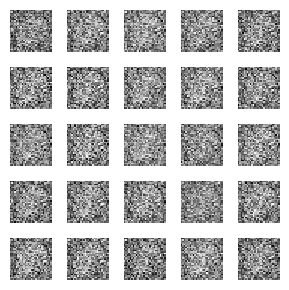

In [ ]:
K.clear_session()
reps = 3
ones_mx = []
ones_list_mx = []

for _ in tqdm(range(reps)):
    # adam_optimizer = keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

    take_discriminator_steps_2 = partial(take_discriminator_steps, X_train=X, k=1)
    getLoss2 = partial(getLoss, X_train=X)
    # create_gan2 = partial(create_gan, opt=adam_optimizer)
    create_gan2 = partial(create_gan, opt=my_optimizer)

    def create_GAN_player():
        # ganPlayer = Players(create_generator(OUTPUT_SIZE=IMAGE_SIZE, opt=adam_optimizer), create_discriminator(INPUT_SIZE=IMAGE_SIZE, opt=adam_optimizer), create_gan2, take_generator_steps, take_discriminator_steps_2, change_network, change_network, perturb_generator)
        ganPlayer = Players(create_generator(OUTPUT_SIZE=IMAGE_SIZE, opt=my_optimizer), create_discriminator(INPUT_SIZE=IMAGE_SIZE, opt=my_optimizer), create_gan2, take_generator_steps, take_discriminator_steps_2, change_network, change_network, perturb_generator)
        return ganPlayer

    ganPlayerGD_mx, losses_mx, ones,ones_list = training_gd_mx(create_GAN_player, create_GAN_player, T=5000)
    ones_mx.append(list(ones))
    ones_list_mx.append(list(ones_list))

Iteration 0
4/4 [==============================] - 0s 2ms/step


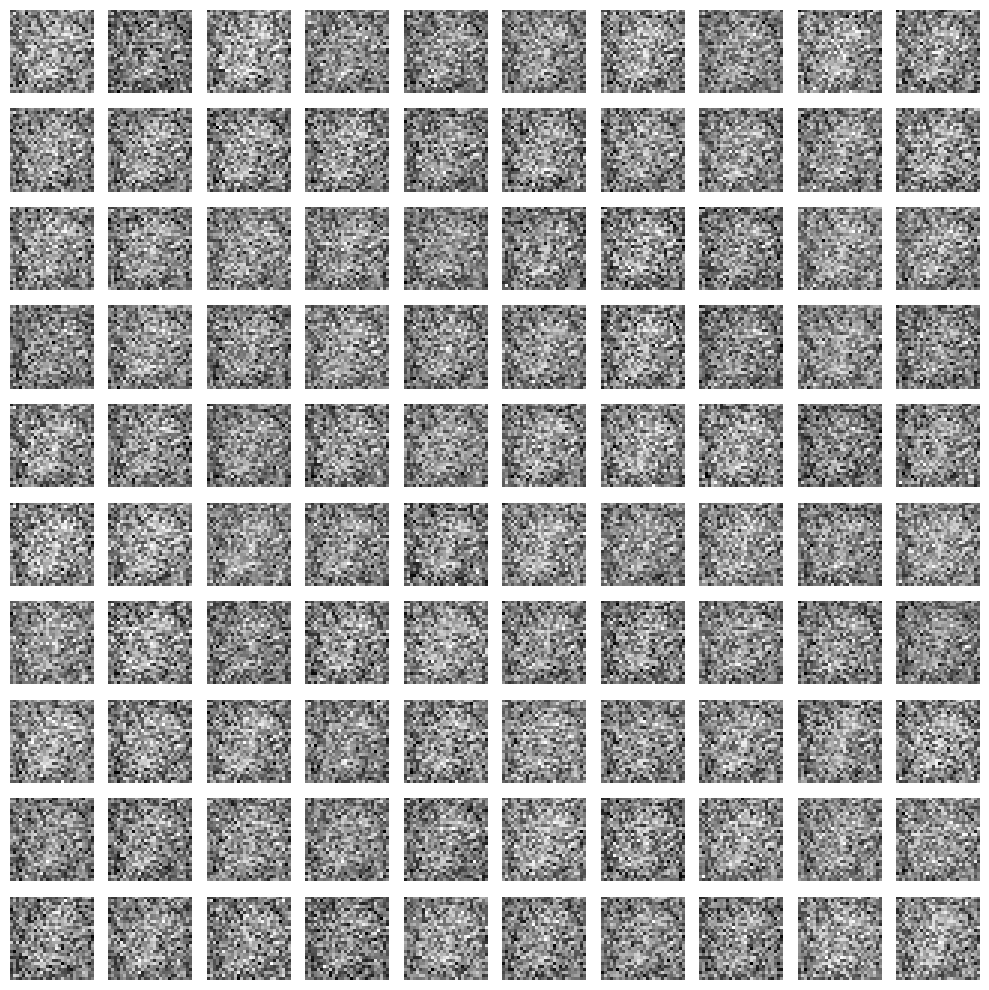

In [ ]:
plot_generated_images(0, ganPlayerGD_mx.get_x(), save=False)

## Comparison Plots

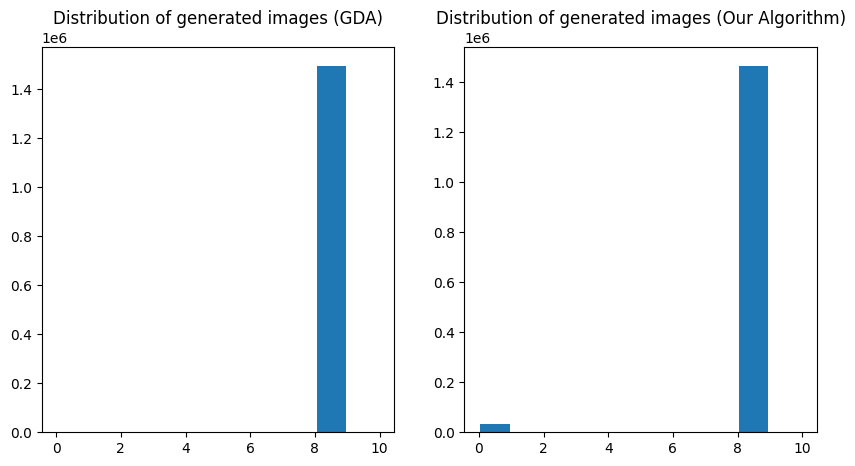

In [ ]:
# Plot the labels:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.hist(np.concatenate(ones_list_gda).reshape(-1), bins=10, range=(0, 10), rwidth=0.9)
plt.title("Distribution of generated images (GDA)")

plt.subplot(1, 2, 2)
plt.hist(np.concatenate(ones_list_mx).reshape(-1), bins=10, range=(0, 10), rwidth=0.9)
plt.title("Distribution of generated images (Our Algorithm)")

plt.show()